# Welcome to Assignment 1 on course CV_CSL442_S21

## <span style='color:red'> ***Instructions:***</span>
#### <span style='color:red'>1. Use Python 3.x, jupyter notebook to run this notebook.</span>
#### <span style='color:red'>2. Write your code only in between the lines 'YOUR CODE STARTS HERE' and 'YOUR CODE ENDS HERE' you sould not change anything else code cells, if you do, the answers you are supposed to get at the end of this assignment might be wrong.</span>
#### <span style='color:red'>3. Read documentation of each function carefully.</span>
#### <span style='color:red'>4. Out of 7 questions we consider best 5 for the evaluation purpose.</span>
#### <span style='color:red'>5. Copying assignment solutions from others is strongly discouraged and will be considered as violation of academic code of conduct.</span>
#### <span style='color:red'>6. Early submitted assignment solutions will be considered for evaluation, so students please check your solutions carefully before submission.</span>
#### <span style='color:red'>7. Required two items for submission:</span>
    1. Solutions jupyter notebook file.
    2. Link to the recorded video of your program explanation and output demo. Try to keep the video duration minimum (preferably 10-15min).
#### <span style='color:red'>8. All the submissions should be submitted only in teams. Assignmnet due date is 15.2.2021 before 5:00PM. Late submission is accepted till 16.2.2021 before 5:00PM with 2 marks penalty from the accquired marks.</span>
#### <span style='color:blue'>***-:All the best:-***</span>

<span style='color:red'>1Q. Using basic image operations combine the scene and object images to get the composite image as shown below.</span>

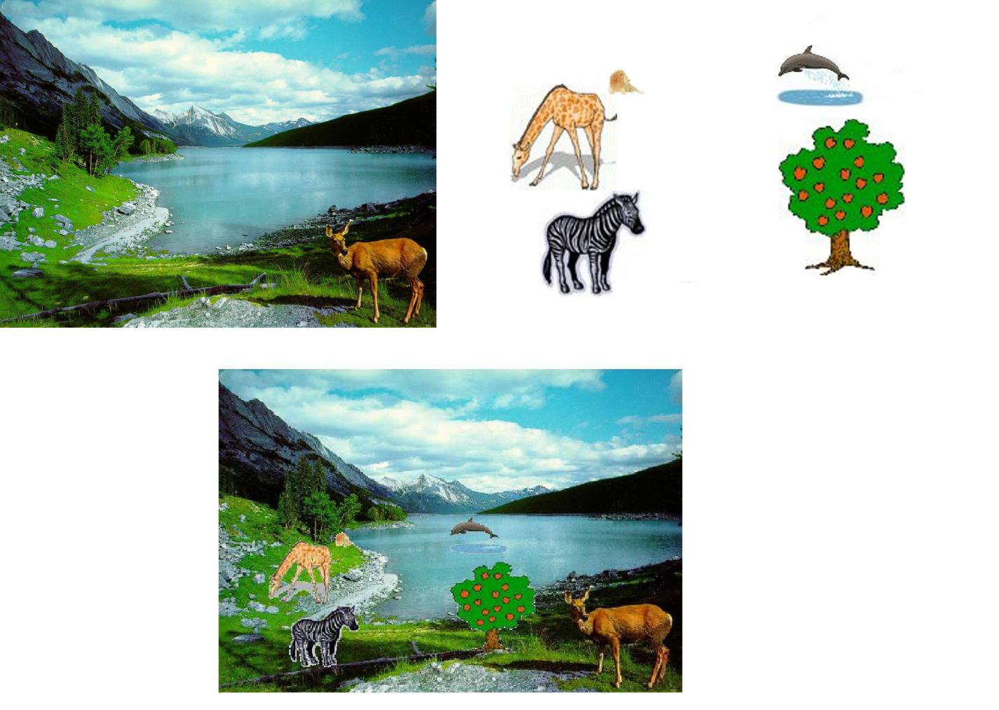

([], [])

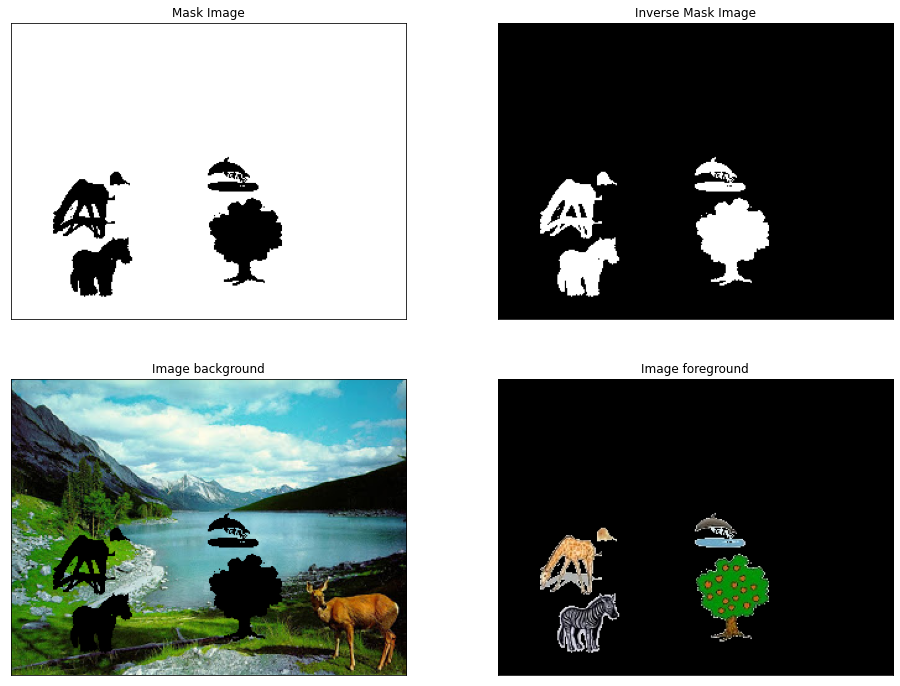

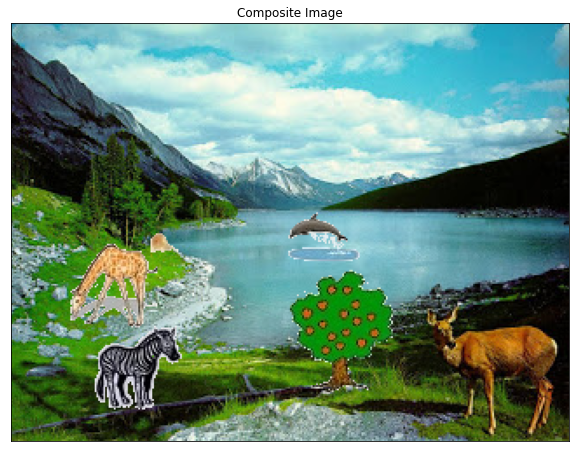

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


img1 = cv2.imread(".\Assignment-1_images\img61.jpg")
img2 = cv2.imread(".\Assignment-1_images\Sample_Image.jpg")

#YOUR CODE STARTS HERE

# Converting BGR to Gray
grayImage = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Creating mask image using 240 as threshold
(thresh, mask) = cv2.threshold(grayImage, 240, 255, cv2.THRESH_BINARY)

# Creating inverted mask by using bitwise NOT operator
mask_inv = cv2.bitwise_not(mask)

# Creating image background by adding mask to scenery
img_background = cv2.bitwise_and(img1, img1, mask = mask)

# Creating image foreground by adding inverted mask to animals
img_foreground = cv2.bitwise_and(img2, img2, mask = mask_inv)

# Creating resultant image by adding background and foreground
res_img = cv2.add(img_background, img_foreground)


#YOUR CODE ENDS HERE

mask=cv2.cvtColor(mask,cv2.COLOR_BGR2RGB)
mask_inv=cv2.cvtColor(mask_inv,cv2.COLOR_BGR2RGB)
img_background=cv2.cvtColor(img_background,cv2.COLOR_BGR2RGB)
img_foreground=cv2.cvtColor(img_foreground,cv2.COLOR_BGR2RGB)
res_img=cv2.cvtColor(res_img,cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16,12))
plt.subplot(2,2,1)
plt.imshow(mask)
plt.title('Mask Image')
plt.xticks([])
plt.yticks([])
plt.subplot(2,2,2)
plt.imshow(mask_inv)
plt.title('Inverse Mask Image')
plt.xticks([])
plt.yticks([])
plt.subplot(2,2,3)
plt.imshow(img_background)
plt.title('Image background')
plt.xticks([])
plt.yticks([])
plt.subplot(2,2,4)
plt.imshow(img_foreground)
plt.title('Image foreground')
plt.xticks([])
plt.yticks([])
plt.figure(figsize=(10,8))
plt.subplot(1,1,1)
plt.imshow(res_img)
plt.title('Composite Image')
plt.xticks([])
plt.yticks([])

<span style='color:red'>2Q. Implement a function domIntensity(im, k), which takes an image im and an integer k and returns a list of k most dominant intensities of that image. Experiment your code on any 3 images to validate the program output.</span>

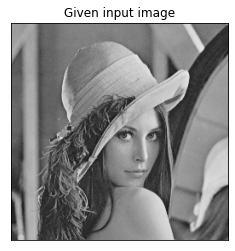

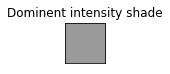

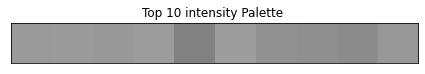

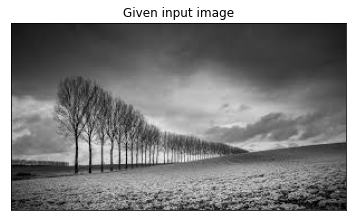

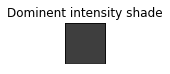

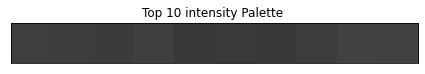

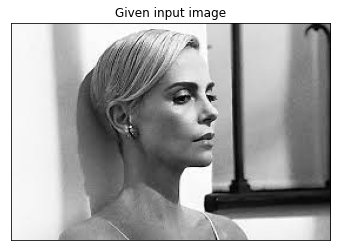

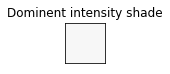

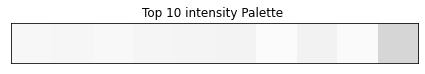

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

def domIntensity(im, k):
    #YOUR CODE STARTS HERE

    # Creating array to store frequency of intensities
    frequency = np.zeros(256, dtype=int)
    
    im = np.reshape(im, -1)
    
    # Store frequency of intensities
    for pixel in im:
        frequency[pixel] = frequency[pixel] + 1
    
    # Sort indices in Descending order
    sorted_intensities_1D = np.zeros(256, dtype = int)
    for i in range(256):
        index = frequency.argmax()
        
        sorted_intensities_1D[i] = index
        
        frequency[index] = 0
    
    sorted_intensities = np.zeros((256,3), dtype=int)
    
    for i in range(256):
        for j in range(3):
            
            sorted_intensities[i][j] = sorted_intensities_1D[i]
    
    #YOUR CODE ENDS HERE
    return sorted_intensities[:k]

def displayIntensityPalette(im, dom_list):
    plt.figure()
    if len(im.shape) == 2:
        plt.imshow(im, cmap = "gray")
    else:
        plt.imshow(im)
    plt.xticks([])
    plt.yticks([])
    plt.title("Given input image")
    k = len(dom_list)
    # Most dominant intensity
    top_im = np.array([[list(dom_list[0])]])
    plt.figure(figsize = (0.75,0.75), frameon=False)
    plt.imshow(top_im)
    plt.title('Dominent intensity shade')
    plt.xticks([])
    plt.yticks([])
    # k most dominant intensity palette
    plt.figure(figsize = ((0.75*k),0.75), frameon=False)
    dom_inty_im = np.array([[list(dom_list[i]) for i in range(k)]])
    plt.imshow(dom_inty_im)
    plt.xticks([])
    plt.yticks([])
    plt.title("Top 10 intensity Palette ")

im = cv2.imread(".\Assignment-1_images\lena_gray_256.jpg")
dom_list = domIntensity(im,10)
displayIntensityPalette(im, dom_list)

im = cv2.imread(".\Assignment-1_images\desert.jpg")
dom_list = domIntensity(im,10)
displayIntensityPalette(im, dom_list)

im = cv2.imread(".\Assignment-1_images\girl.jpg")
dom_list = domIntensity(im,10)
displayIntensityPalette(im, dom_list)

<span style='color:red'>3Q. Write a function <span style='color:blue'>histogramEqualization(image)</span> to stretch the image contrast. Using this function enhance the images histogram1.jpg, histogram2.jpg and histogram3.jpg and compare it with inbuilt function results. Record the observations.</span> 

320


<Figure size 1152x864 with 0 Axes>

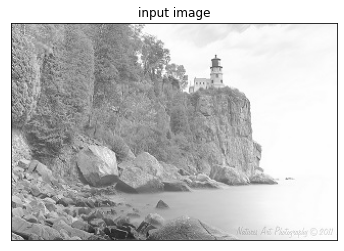

<Figure size 1152x864 with 0 Axes>

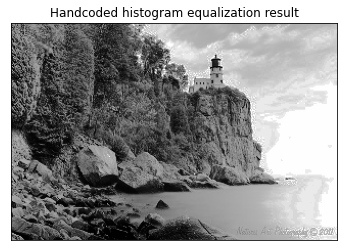

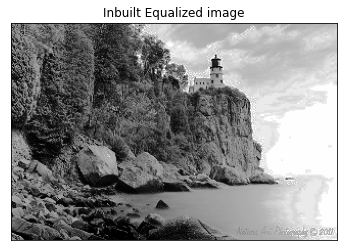

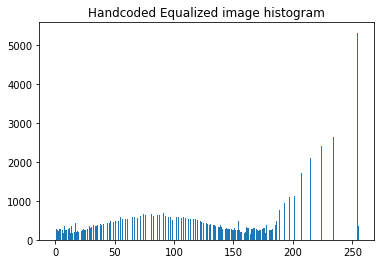

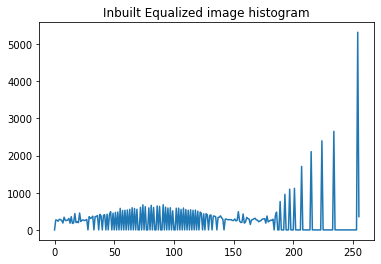

400


<Figure size 1152x864 with 0 Axes>

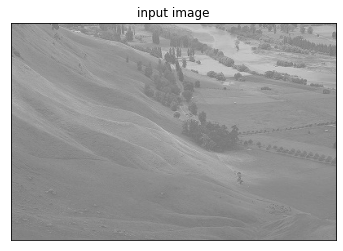

<Figure size 1152x864 with 0 Axes>

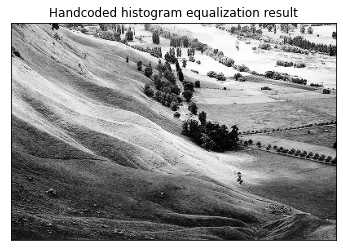

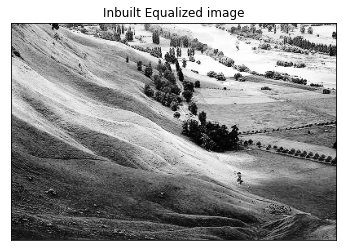

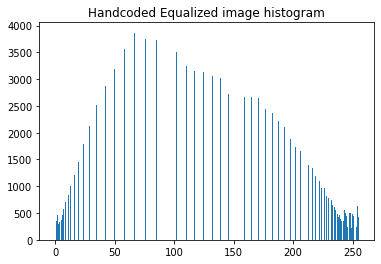

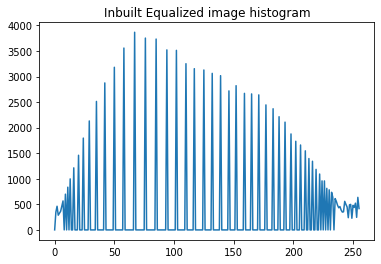

250


<Figure size 1152x864 with 0 Axes>

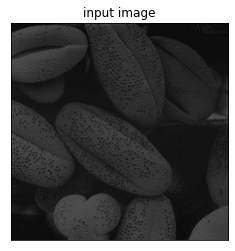

<Figure size 1152x864 with 0 Axes>

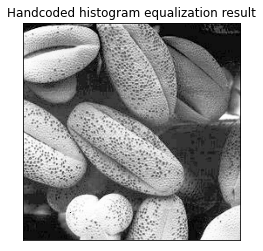

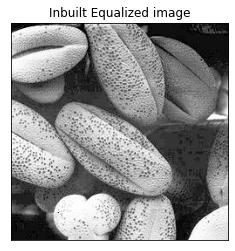

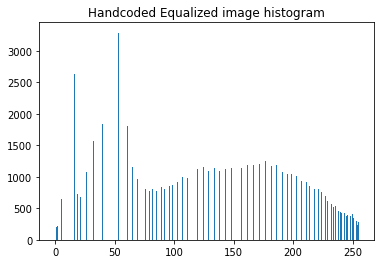

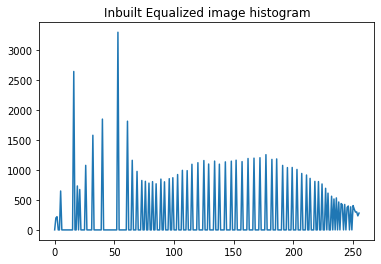

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
%matplotlib inline

def plotHistogram(im):
    #YOUR CODE STARTS HERE

    frequency = np.zeros(256, dtype='double')
    image = np.reshape(im, -1)
    
    # Store frequency of intensities
    for pixel in image:
        frequency[pixel] = frequency[pixel] + 1
        
    #YOUR CODE ENDS HERE
    return frequency

def histogramEqualization(im):
    #YOUR CODE STARTS HERE
    
    frequency = np.zeros(256, dtype='int')
    rows = im.shape[0]
    cols = im.shape[1]
    MN = rows*cols
    print(cols)
    
    image = np.reshape(im, -1)
    
    # Store frequency of intensities
    for pixel in image:
        frequency[pixel] = frequency[pixel] + 1
    
    #print(frequency)
    
    pdf = np.zeros(256, dtype='double')
    
    pdf = frequency/MN
        
    cdf = pdf
    
    # Calculating the Cumulative distribution
    for i in range(1, 256):
        cdf[i] = (cdf[i] + cdf[i-1])
    
    cdf = cdf*255
    cdf = cdf + 1
    cdf = cdf.astype('uint8')
    #print(cdf)
    
    for i in range(0, MN):
        image[i] = cdf[image[i]]
        
    im_new = np.reshape(image, im.shape)
    #print(im_new)
    
    #YOUR CODE ENDS HERE
    return im_new

he = cv2.imread('.\Assignment-1_images\histogram1.jpg',0)
he1=cv2.cvtColor(he,cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16,12))
plt.figure()
plt.title("input image")
plt.imshow(he1)
plt.xticks([])
plt.yticks([])

# Implemented
eq_img= histogramEqualization(he)
hist=plotHistogram(eq_img)
eq_img=cv2.cvtColor(eq_img,cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16,12))
plt.figure()
plt.title("Handcoded histogram equalization result")
plt.imshow(eq_img)
plt.xticks([])
plt.yticks([])

#inbuilt
inbuilt_hist_img=cv2.equalizeHist(he)
inbuilt_hist = cv2.calcHist([eq_img], [0], None, [256], [0, 256])

plt.figure()
plt.title("Inbuilt Equalized image")
plt.imshow(inbuilt_hist_img, cmap = "gray")
plt.xticks([])
plt.yticks([])

plt.figure()
plt.title("Handcoded Equalized image histogram")
plt.bar(range(256),hist)
plt.show()
plt.figure()
plt.title("Inbuilt Equalized image histogram")
plt.plot(inbuilt_hist)
plt.show()


he = cv2.imread('.\Assignment-1_images\histogram2.jpg',0)
he1=cv2.cvtColor(he,cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16,12))
plt.figure()
plt.title("input image")
plt.imshow(he1)
plt.xticks([])
plt.yticks([])

# Implemented
eq_img= histogramEqualization(he)
hist=plotHistogram(eq_img)
eq_img=cv2.cvtColor(eq_img,cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16,12))
plt.figure()
plt.title("Handcoded histogram equalization result")
plt.imshow(eq_img)
plt.xticks([])
plt.yticks([])

#inbuilt
inbuilt_hist_img=cv2.equalizeHist(he)
inbuilt_hist = cv2.calcHist([eq_img], [0], None, [256], [0, 256])

plt.figure()
plt.title("Inbuilt Equalized image")
plt.imshow(inbuilt_hist_img, cmap = "gray")
plt.xticks([])
plt.yticks([])

plt.figure()
plt.title("Handcoded Equalized image histogram")
plt.bar(range(256),hist)
plt.show()
plt.figure()
plt.title("Inbuilt Equalized image histogram")
plt.plot(inbuilt_hist)
plt.show()


he = cv2.imread('.\Assignment-1_images\histogram3.jpg',0)
he1=cv2.cvtColor(he,cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16,12))
plt.figure()
plt.title("input image")
plt.imshow(he1)
plt.xticks([])
plt.yticks([])

# Implemented
eq_img= histogramEqualization(he)
hist=plotHistogram(eq_img)
eq_img=cv2.cvtColor(eq_img,cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16,12))
plt.figure()
plt.title("Handcoded histogram equalization result")
plt.imshow(eq_img)
plt.xticks([])
plt.yticks([])

#inbuilt
inbuilt_hist_img=cv2.equalizeHist(he)
inbuilt_hist = cv2.calcHist([eq_img], [0], None, [256], [0, 256])

plt.figure()
plt.title("Inbuilt Equalized image")
plt.imshow(inbuilt_hist_img, cmap = "gray")
plt.xticks([])
plt.yticks([])

plt.figure()
plt.title("Handcoded Equalized image histogram")
plt.bar(range(256),hist)
plt.show()
plt.figure()
plt.title("Inbuilt Equalized image histogram")
plt.plot(inbuilt_hist)
plt.show()

<span style='color:red'>4Q.Images of outdoor scenes are often degraded by haze (due to fog, dust, etc). Light is attenuated by its passage through the atmosphere, and additional unwanted scattered light is added. We want to enhance the images to remove the effect of the haze. Look at input histograms of images “haze1.tif” and “haze2.tif”. Let’s assume that the pixels in the degraded image that have the lowest values (in each color band) actually should be pure black, and the pixels that have the highest values (in each color band) are actually should be pure white. A simple de-hazing algorithm is to take a color image, and for each band (red, green, blue), stretch its values to occupy the full range (0 to 255), such that 1% of data at the extreme ends is saturated at the low and high values (see Matlab’s “imadjust”). Then put the bands back together into an RGB image. Implement this algorithm and test it on the given images.</span>

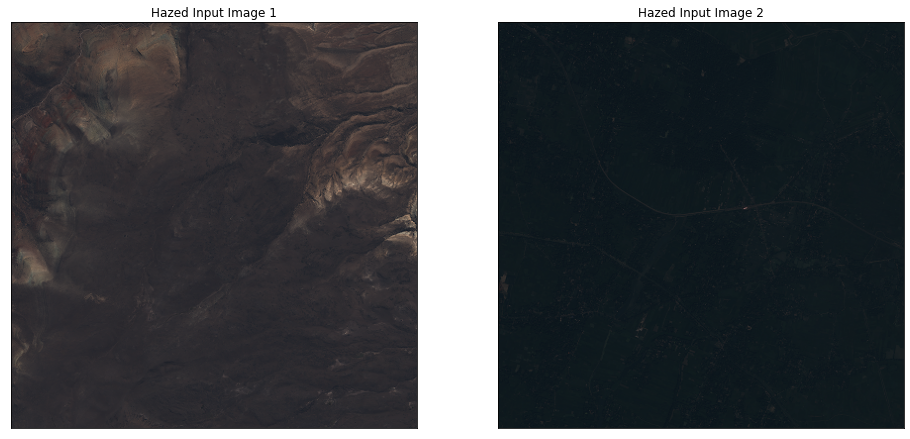

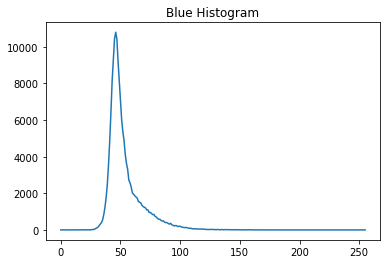

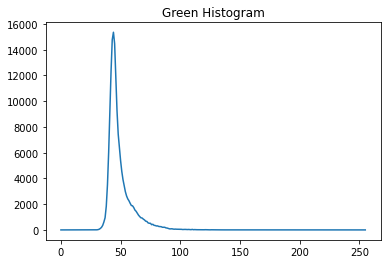

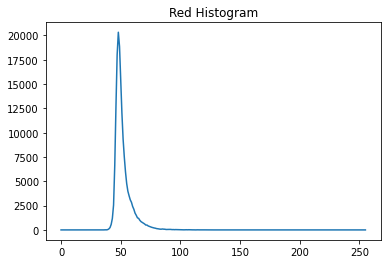

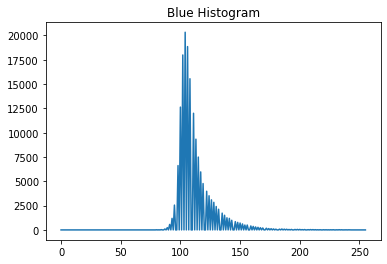

...

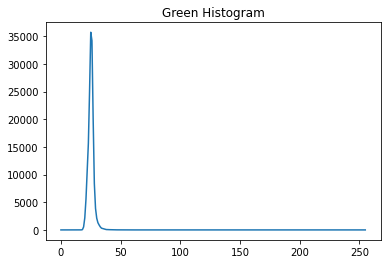

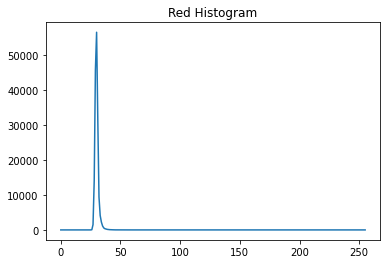

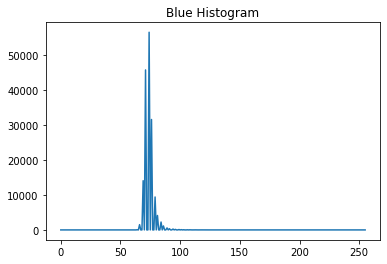

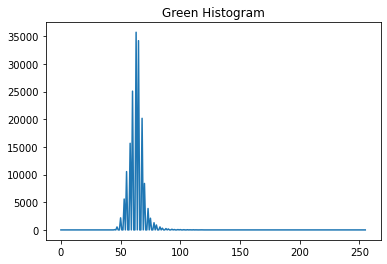

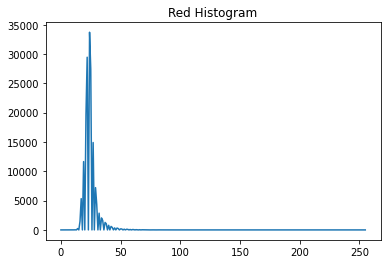

([], [])

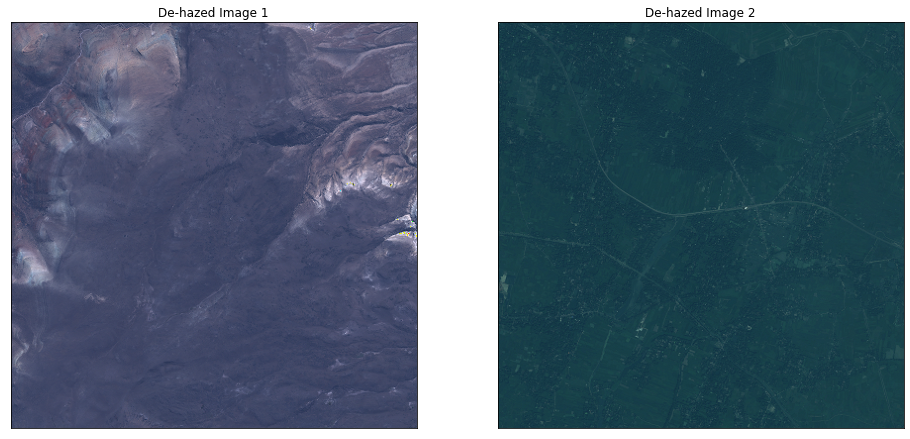

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
%matplotlib inline

# YOUR CODE STARTS HERE

def display_hist(image):
    #extract channels and plot histograms for each channel
    b = cv2.calcHist([image], [0], None, [256], [0, 256])
    plt.figure()
    plt.plot(b)
    plt.title("Blue Histogram")
    plt.show()

    g = cv2.calcHist([image], [1], None, [256], [0, 256])
    plt.figure()
    plt.plot(g)
    plt.title("Green Histogram")
    plt.show()
    
    r = cv2.calcHist([image], [2], None, [256], [0, 256])
    plt.figure()
    plt.plot(r)
    plt.title("Red Histogram")
    plt.show()


def stretch(image):
    maxi = image.max()
    mini = image.min()
    
    x = float(255/(maxi-mini))
    
    image = image.astype('double')
    
    image = x*image
    
    image = image.astype('uint8')
     
    return image

def dehaze(image):
    # Display histograms before dehazing
    display_hist(image)
    
    # Split the image bands
    b = image[:,:,0]
    g = image[:,:,1]
    r = image[:,:,2]
    
    # Stretch each band
    b = stretch(b)
    g = stretch(g)
    r = stretch(r)
    
    # Merge bands to form image and return
    image = cv2.merge((r,g,b))
    
    # Display histograms after dehazing
    display_hist(image)
    
    return image
    
# Reading 2 hazed images
im1 = cv2.imread('.\Assignment-1_images\haze1.tif')
im1 = cv2.cvtColor(im1,cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16,22))
plt.subplot(1,2,1)
plt.imshow(im1)
plt.title('Hazed Input Image 1')
plt.xticks([])
plt.yticks([])

im2 = cv2.imread('.\Assignment-1_images\haze2.tif')
im2 = cv2.cvtColor(im2,cv2.COLOR_BGR2RGB)
plt.subplot(1,2,2)
plt.imshow(im2)
plt.title('Hazed Input Image 2')
plt.xticks([])
plt.yticks([])

# De-hazing the images
im1_hazed = dehaze(im1)
im1_hazed = cv2.cvtColor(im1_hazed,cv2.COLOR_BGR2RGB)

im2_hazed = dehaze(im2)
im2_hazed = cv2.cvtColor(im2_hazed,cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16,22))
plt.subplot(1,2,1)
plt.imshow(im1_hazed)
plt.title('De-hazed Image 1')
plt.xticks([])
plt.yticks([])

plt.subplot(1,2,2)
plt.imshow(im2_hazed)
plt.title('De-hazed Image 2')
plt.xticks([])
plt.yticks([])

# YOUR CODE ENDS HERE

<span style='color:red'>5Q. Try to enhance the ‘skeleton.jpg’ image by performing the sequence of operations given as comments in the program. make note of the observations in each step. </span>
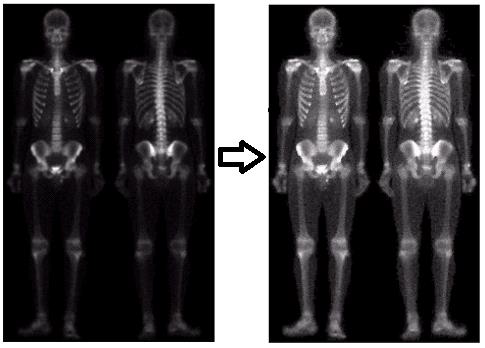

([], [])

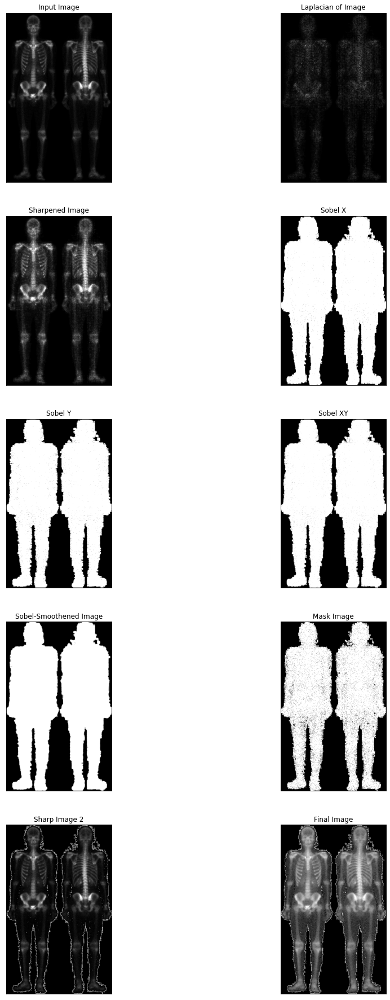

In [8]:
# Question 5: Sequence of steps to enhance the image.

#1. (a).read image of whole body bone scan.
#2. (b) Laplacian of (a).
#3. (c) Sharpened image obtained by adding (a) and (b).
#4. (d) Sobel gradient of image (a).
#5. (e) Sobel image smoothed with a 5 × 5 box filter.
#6. (f) Mask image formed by the product of (b) and (e).
#7. (g) Sharpened image obtained by the adding images (a) and (f).
#8. (h) Final result obtained by applying a power-law transformation to (g).

#YOUR CODE STARTS HERE

import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
%matplotlib inline

# Read image
image = cv2.imread('.\Assignment-1_images\skeleton.tif',cv2.IMREAD_COLOR)
img = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(16,32))
plt.subplot(5,2,1)
plt.imshow(img, cmap='gray')
plt.title('Input Image')
plt.xticks([])
plt.yticks([])

# Laplacian of (a)
lp = cv2.Laplacian(img, cv2.CV_16S, ksize=3)
lp = cv2.convertScaleAbs(lp)
plt.subplot(5,2,2)
plt.imshow(lp, cmap='gray')
plt.title('Laplacian of Image')
plt.xticks([])
plt.yticks([])

# Sharpening the image 
sharp_img = cv2.add(img, lp)
plt.subplot(5,2,3)
plt.imshow(sharp_img, cmap='gray')
plt.title('Sharpened Image')
plt.xticks([])
plt.yticks([])

# Sobel gradient of original image
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=9)  # x
sobelx = cv2.convertScaleAbs(sobelx)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=9)  # y
sobely = cv2.convertScaleAbs(sobely)
plt.subplot(5,2,4)
plt.imshow(sobelx, cmap='gray')
plt.title('Sobel X')
plt.xticks([])
plt.yticks([])
plt.subplot(5,2,5)
plt.imshow(sobely, cmap='gray')
plt.title('Sobel Y')
plt.xticks([])
plt.yticks([])

sobelxy = cv2.addWeighted(sobelx, 0.5, sobely, 0.5, 0)
plt.subplot(5,2,6)
plt.imshow(sobelxy, cmap='gray')
plt.title('Sobel XY')
plt.xticks([])
plt.yticks([])

# Sobel image smoothening with a 5 × 5 box filter
smooth = cv2.medianBlur(sobelxy,5)
plt.subplot(5,2,7)
plt.imshow(smooth, cmap='gray')
plt.title('Sobel-Smoothened Image')
plt.xticks([])
plt.yticks([])


# Mask image formed by the product of (b) and (e)
mask = cv2.multiply(lp,smooth)
plt.subplot(5,2,8)
plt.imshow(mask, cmap='gray')
plt.title('Mask Image')
plt.xticks([])
plt.yticks([])

# Getting sharpened image
sharp_img_2 = img + mask
plt.subplot(5,2,9)
plt.imshow(sharp_img_2, cmap='gray')
plt.title('Sharp Image 2')
plt.xticks([])
plt.yticks([])

# Applying Power Law Transformation
gamma = 0.4
result = np.array(255*(sharp_img_2 / 255) ** gamma, dtype = 'uint8')
result = cv2.cvtColor(result, cv2.COLOR_GRAY2BGR)
plt.subplot(5,2,10)
plt.imshow(result)
plt.title('Final Image')
plt.xticks([])
plt.yticks([])

#YOUR CODE ENDS HERE

<span style='color:red'>6Q. Write a program to find the largest correlation spot in the given image (hills.jpg) using linear filtering based template matching technique. Draw rectangular bounding box at the detected template (template.png) matched locations.</span>

([], [])

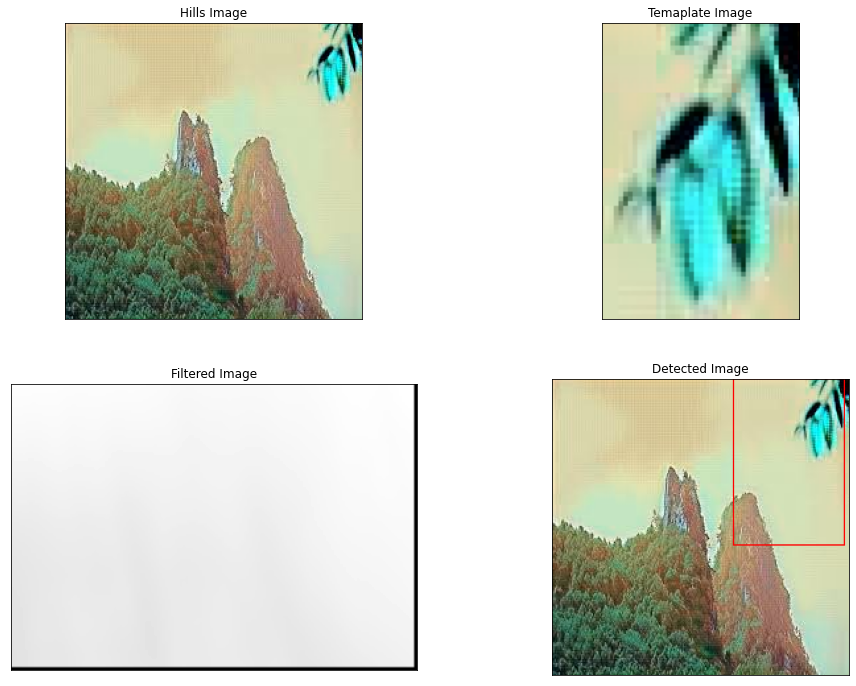

In [88]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
%matplotlib inline

# Implement Linear Filtering technique on an image using a linear filter #correlation
def linear_filter(image, filter_): # 'filter' is a keyword in python, so is the underscore at the end.
    """
    Performs linear filtering on an image.
    Assume image size is W1xW2, filter size is F1xF2.
    
    Arguments:
    image -- input image possibly with 3 channels(RGB).
    filter_ -- linear filter to apply on image.
    
    Returns:
    result -- filtered image. 
    """
    # DO NOT CHAGE THIS CODE
    image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)    
    #image = np.array(image.convert('L')) # converts image to gray scale, so that it is easy to apply filter
    image_height, image_width = image.shape[0], image.shape[1]

    filter_ = cv2.cvtColor(filter_,cv2.COLOR_BGR2GRAY)
    #filter_ = np.array(filter_.convert('L'))
    filter_height, filter_width = filter_.shape[0], filter_.shape[1]

    # result shape will be of size --> (((W1−F1+2P) / S) + 1) x (((W2−F2+2P) / S) + 1), where 'P' is padding length
    # S is stride length, if you don't know about them, don't worry, you will learn in upcoming lectures.For now
    # we will use simplest setting P=0,S=1. See the next line.

    result_height, result_width = (image_height - filter_height) + 1, (image_width - filter_width) + 1
    result = np.array([[0 for j in range(result_width)] for i in range(result_height)])
    # YOUR CODE STARTS HERE

    global X  
    global Y 
    
    Maximum = 0
    
    first_row = int(filter_height/2)
    first_col =  int(filter_width/2)
    last_row = image_height - int(filter_height/2)
    last_col = image_width - int(filter_width/2)    

    # Apply the filter
    for x in range(first_row,last_row):
        
        for y in range(first_col,last_col):
            
            # Find the submatrix
            sub_matrix = image[x-int(filter_height/2):x+int(filter_height/2),y-int(filter_width/2):y+int(filter_width/2)]
            
            sub_matrix = np.reshape(sub_matrix,-1)
            sub_matrix = sub_matrix.astype('float')
            filter_ = np.reshape(filter_,-1)
            filter_ = filter_.astype('float')
            
        
            # Get the normalized do product
            numerator = float(np.sum(np.multiply(sub_matrix,filter_)))
            denominator = float(np.linalg.norm(sub_matrix)*np.linalg.norm(filter_))
            
            norm = float(numerator/denominator)
            
            # Get the response image
            result[x-int(filter_height/2)][y-int(filter_width/2)] = int(norm*255)
            
            # Calculate the loaction where response is max
            if norm > Maximum:
                
                Maximum = norm
                X,Y = x,y
            
    
    # YOUR CODE ENDS HERE
    return result

# Main function 
X = 0 
Y = 0

# To test your implementation, run the below code.
image = cv2.imread('Assignment-1_images/hills.jpeg')

# Display given image
plt.figure(figsize=(16,12))
plt.subplot(2,2,1)
plt.imshow(image)
plt.title('Hills Image')
plt.xticks([])
plt.yticks([])

filter_ = cv2.imread('Assignment-1_images/template.png')

# Display provided filter
plt.subplot(2,2,2)
plt.imshow(filter_)
plt.title('Temaplate Image')
plt.xticks([])
plt.yticks([])

result = linear_filter(image, filter_)

# Display Filtered Image
plt.subplot(2,2,3)
plt.imshow(result, cmap="gray")
plt.title('Filtered Image')
plt.xticks([])
plt.yticks([]) 

# Get the padding values
x_padding = int(filter_.shape[0]/2)
y_padding = int(filter_.shape[1]/2)


# Drawing Rectangle box around matching spot
cv2.line(image,(Y - y_padding, X + x_padding), (Y + y_padding, X + x_padding), (255,0,0),1)
cv2.line(image,(Y - y_padding, X + x_padding), (Y - y_padding, X - x_padding), (255,0,0),1)
cv2.line(image,(Y + y_padding, X + x_padding), (Y + y_padding, X - x_padding), (255,0,0),1)
cv2.line(image,(Y + y_padding, X - x_padding), (Y - y_padding, X - x_padding), (255,0,0),1)

# Displaying final image
plt.subplot(2,2,4)
plt.imshow(image)
plt.title('Detected Image')
plt.xticks([])
plt.yticks([])


<span style='color:red'>7Q. Write functions/subroutines to design spatial filters (sizes of 3X3 and 5X5) - mean, median, Min-Max. For the given noise images. Apply the appropriate filter to enhance the image quality. use images Cameraman_SandP_0.08.jpg, Camerman_G_0.05.jpg. Make observations upon comparing their outputs.</span> 

([], [])

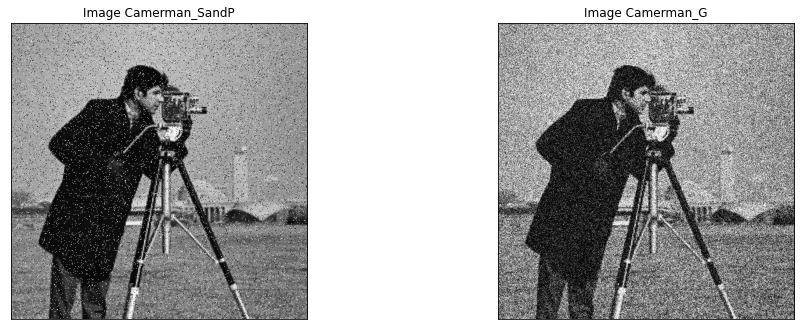

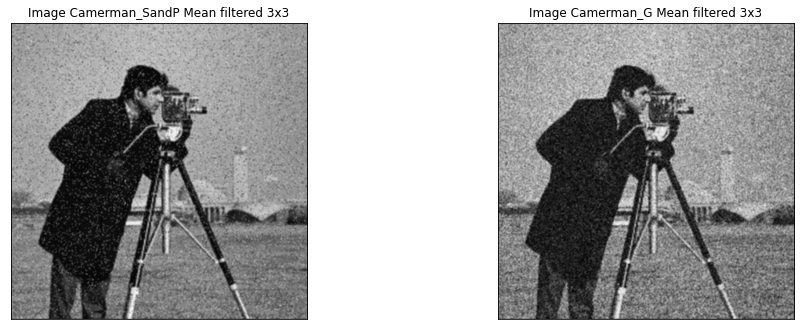

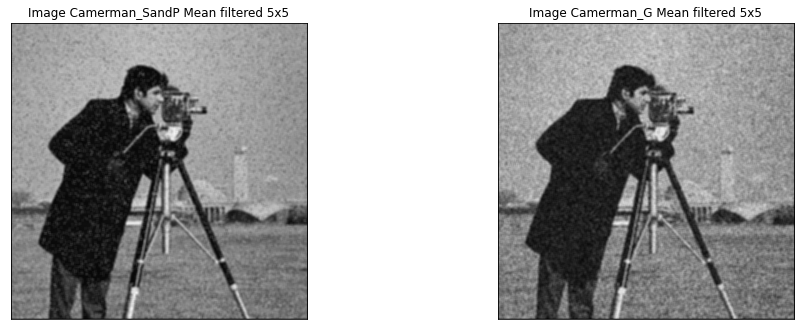

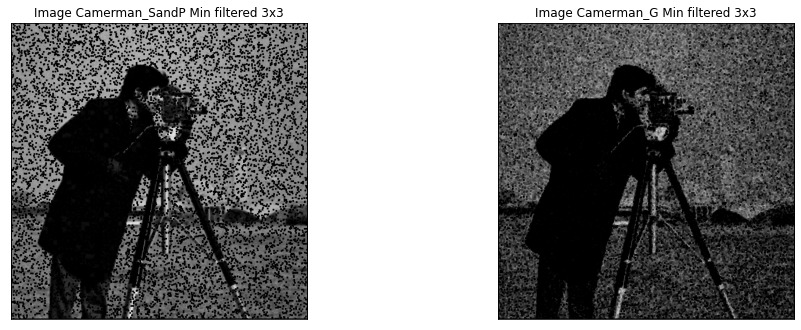

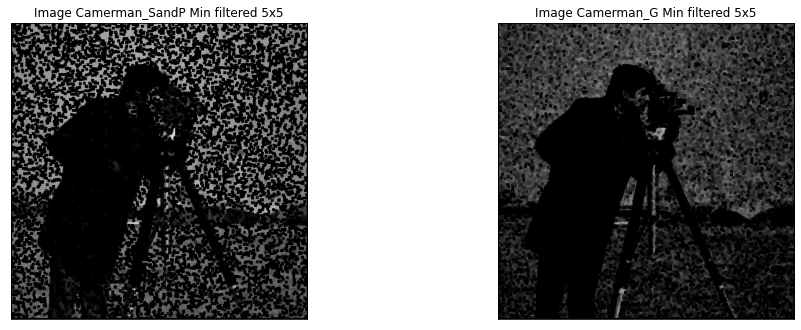

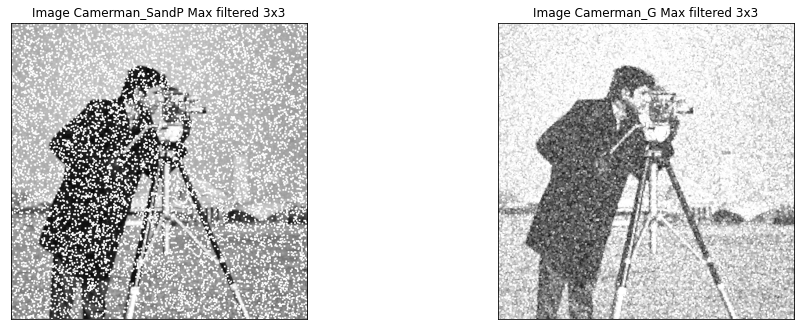

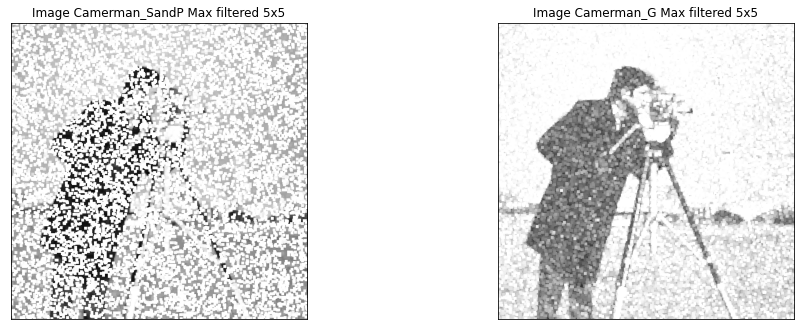

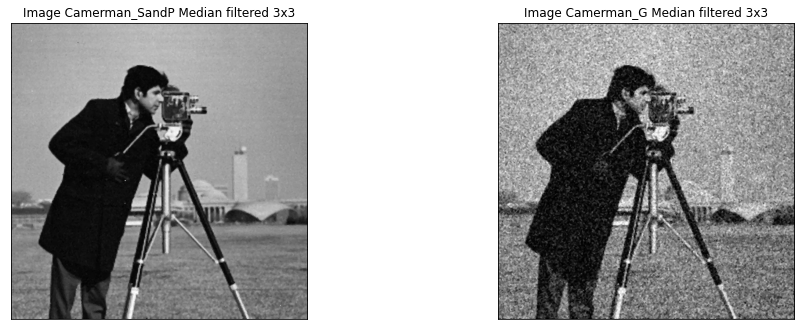

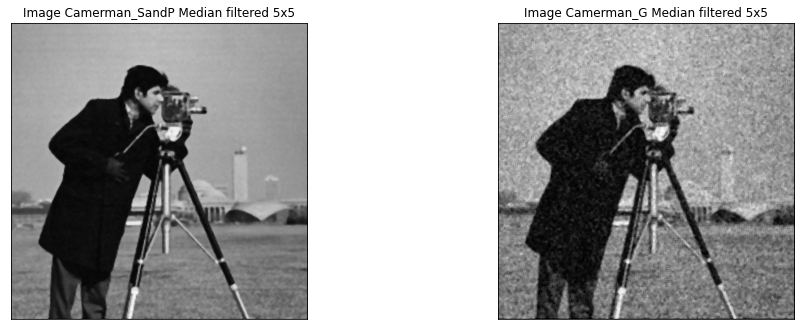

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
%matplotlib inline

#YOUR CODE STARTS HERE

# Mean Filter
def mean_filter(image, filter_size):
        
    padding = int(filter_size/2)
    
    # Padding the image
    image= cv2.copyMakeBorder(image,padding,padding,padding,padding,cv2.BORDER_CONSTANT,value=0)

    new_image = np.zeros(image.shape,dtype='uint8')
    
    height = image.shape[0]
    width = image.shape[1]
    
    first_col = padding
    first_row = padding
    last_col = width - padding
    last_row = height - padding
    
    # Apply the filter
    for x in range(first_row,last_row):
        
        for y in range(first_col,last_col):
            
            # Calculating Average
            sub_matrix = image[x-padding:x+padding+1,y-padding:y+padding+1]
            summation = np.sum(sub_matrix)
            total = filter_size*filter_size
            avg = int(summation/total)
            
            # Set new pixel value
            new_image[x][y] = avg
    
    new_image = new_image[first_row:last_row,first_col:last_col]
    
    return new_image


# Median Filter
def median_filter(image, filter_size):

    padding = int(filter_size/2)
    
    # Padding the image
    image= cv2.copyMakeBorder(image,padding,padding,padding,padding,cv2.BORDER_CONSTANT,value=0)
    new_image = np.zeros(image.shape,dtype='uint8')
    height = image.shape[0]
    width = image.shape[1]
    
    first_col = padding
    first_row = padding
    last_col = width - padding
    last_row = height - padding
    
    # Apply the filter and get the Median value
    for x in range(first_row,last_row):
        
        for y in range(first_col,last_col):
            
            sub_matrix = image[x-padding:x+padding+1,y-padding:y+padding+1]
            median_ = np.median(sub_matrix)
            new_image[x][y] = median_
            
    new_image = new_image[first_row:last_row,first_col:last_col]
    return new_image

  
# Min Filter
def min_filter(image, filter_size):
    
    padding = int(filter_size/2)
    
    # Padding the image
    image= cv2.copyMakeBorder(image,padding,padding,padding,padding,cv2.BORDER_CONSTANT,value=0)
    
    new_image = np.zeros(image.shape,dtype='uint8')
    
    height = image.shape[0]
    width = image.shape[1]
    
    first_col = padding
    first_row = padding
    last_col = width - padding
    last_row = height - padding
    
    # Apply the filter
    for x in range(first_row,last_row):
        
        for y in range(first_col,last_col):
            
            #getb the min value
            sub_matrix = image[x-padding:x+padding+1,y-padding:y+padding+1]
            minimum = np.min(sub_matrix)
    
            new_image[x][y] = minimum
            
    
    new_image = new_image[first_row:last_row,first_col:last_col]
    
    return new_image


# Max Filter
def max_filter(image, filter_size):
    
    padding = int(filter_size/2)
    
    # Padding the image
    image= cv2.copyMakeBorder(image,padding,padding,padding,padding,cv2.BORDER_CONSTANT,value=0)
    new_image = np.zeros(image.shape,dtype='uint8')
    height = image.shape[0]
    width = image.shape[1]
    
    first_col = padding
    first_row = padding
    last_col = width - padding
    last_row = height - padding
    
    for x in range(first_row,last_row):
        
        for y in range(first_col,last_col):
            
            # Getting Maximum value
            sub_matrix = image[x-padding:x+padding+1,y-padding:y+padding+1]
            maximum = np.max(sub_matrix)
            new_image[x][y] = maximum
            
    new_image = new_image[first_row:last_row,first_col:last_col]
    return new_image



# Main Function

# Reading the images
img1 = cv2.imread('.\Assignment-1_images\Cameraman_SandP_0.08.jpg',0)
img1_plot=cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)

img2 = cv2.imread('.\Assignment-1_images\Camerman_G_0.05.jpg',0)
img2_plot=cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)


# Displaying Original images
plt.figure(figsize=(16,12))
plt.subplot(2,2,1)
plt.imshow(img1_plot)
plt.title('Image Camerman_SandP')
plt.xticks([])
plt.yticks([])

plt.subplot(2,2,2)
plt.imshow(img2_plot)
plt.title('Image Camerman_G')
plt.xticks([])
plt.yticks([])


# Applying Mean filters (SIZE = 3X3)

img1_filtered = mean_filter(img1,3)
img1_filtered_plot=cv2.cvtColor(img1_filtered,cv2.COLOR_BGR2RGB)
img2_filtered = mean_filter(img2,3)
img2_filtered_plot=cv2.cvtColor(img2_filtered,cv2.COLOR_BGR2RGB)

# Displaying mean filtered images (SIZE = 3X3)
plt.figure(figsize=(16,12))
plt.subplot(2,2,1)
plt.imshow(img1_filtered_plot)
plt.title('Image Camerman_SandP Mean filtered 3x3')
plt.xticks([])
plt.yticks([])
plt.subplot(2,2,2)
plt.imshow(img2_filtered_plot)
plt.title('Image Camerman_G Mean filtered 3x3')
plt.xticks([])
plt.yticks([])

# Applying Mean filters (SIZE = 5X5)
img1_filtered = mean_filter(img1,5)
img1_filtered_plot=cv2.cvtColor(img1_filtered,cv2.COLOR_BGR2RGB)
img2_filtered = mean_filter(img2,5)
img2_filtered_plot=cv2.cvtColor(img2_filtered,cv2.COLOR_BGR2RGB)

# Displaying mean filtered images (SIZE = 5x5)
plt.figure(figsize=(16,12))
plt.subplot(2,2,1)
plt.imshow(img1_filtered_plot)
plt.title('Image Camerman_SandP Mean filtered 5x5')
plt.xticks([])
plt.yticks([])

plt.subplot(2,2,2)
plt.imshow(img2_filtered_plot)
plt.title('Image Camerman_G Mean filtered 5x5')
plt.xticks([])
plt.yticks([])



# Applying Min filters (SIZE = 3X3)
img1_filtered = min_filter(img1,3)
img1_filtered_plot=cv2.cvtColor(img1_filtered,cv2.COLOR_BGR2RGB)
img2_filtered = min_filter(img2,3)
img2_filtered_plot=cv2.cvtColor(img2_filtered,cv2.COLOR_BGR2RGB)

# Displaying min filtered images (SIZE = 3X3)
plt.figure(figsize=(16,12))
plt.subplot(2,2,1)
plt.imshow(img1_filtered_plot)
plt.title('Image Camerman_SandP Min filtered 3x3')
plt.xticks([])
plt.yticks([])

plt.subplot(2,2,2)
plt.imshow(img2_filtered_plot)
plt.title('Image Camerman_G Min filtered 3x3')
plt.xticks([])
plt.yticks([])

# Applying Min filters (SIZE = 5X5)
img1_filtered = min_filter(img1,5)
img1_filtered_plot=cv2.cvtColor(img1_filtered,cv2.COLOR_BGR2RGB)
img2_filtered = min_filter(img2,5)
img2_filtered_plot=cv2.cvtColor(img2_filtered,cv2.COLOR_BGR2RGB)

# Displaying min filtered images (SIZE = 5x5)
plt.figure(figsize=(16,12))
plt.subplot(2,2,1)
plt.imshow(img1_filtered_plot)
plt.title('Image Camerman_SandP Min filtered 5x5')
plt.xticks([])
plt.yticks([])

plt.subplot(2,2,2)
plt.imshow(img2_filtered_plot)
plt.title('Image Camerman_G Min filtered 5x5')
plt.xticks([])
plt.yticks([])


# Applying Max filters (SIZE = 3X3)

img1_filtered = max_filter(img1,3)
img1_filtered_plot=cv2.cvtColor(img1_filtered,cv2.COLOR_BGR2RGB)
img2_filtered = max_filter(img2,3)
img2_filtered_plot=cv2.cvtColor(img2_filtered,cv2.COLOR_BGR2RGB)

# Displaying max filtered images (SIZE = 3X3)
plt.figure(figsize=(16,12))
plt.subplot(2,2,1)
plt.imshow(img1_filtered_plot)
plt.title('Image Camerman_SandP Max filtered 3x3')
plt.xticks([])
plt.yticks([])

plt.subplot(2,2,2)
plt.imshow(img2_filtered_plot)
plt.title('Image Camerman_G Max filtered 3x3')
plt.xticks([])
plt.yticks([])

# Applying Max filters (SIZE = 5X5)
img1_filtered = max_filter(img1,5)
img1_filtered_plot=cv2.cvtColor(img1_filtered,cv2.COLOR_BGR2RGB)
img2_filtered = max_filter(img2,5)
img2_filtered_plot=cv2.cvtColor(img2_filtered,cv2.COLOR_BGR2RGB)

# Displaying max filtered images (SIZE = 5x5)
plt.figure(figsize=(16,12))
plt.subplot(2,2,1)
plt.imshow(img1_filtered_plot)
plt.title('Image Camerman_SandP Max filtered 5x5')
plt.xticks([])
plt.yticks([])

plt.subplot(2,2,2)
plt.imshow(img2_filtered_plot)
plt.title('Image Camerman_G Max filtered 5x5')
plt.xticks([])
plt.yticks([])


# Applying Median filters (SIZE = 3x3)

img1_filtered = median_filter(img1,3)
img1_filtered_plot=cv2.cvtColor(img1_filtered,cv2.COLOR_BGR2RGB)
img2_filtered = median_filter(img2,3)
img2_filtered_plot=cv2.cvtColor(img2_filtered,cv2.COLOR_BGR2RGB)

# Displaying Median filtered images (SIZE = 3x3)
plt.figure(figsize=(16,12))
plt.subplot(2,2,1)
plt.imshow(img1_filtered_plot)
plt.title('Image Camerman_SandP Median filtered 3x3')
plt.xticks([])
plt.yticks([])

plt.subplot(2,2,2)
plt.imshow(img2_filtered_plot)
plt.title('Image Camerman_G Median filtered 3x3')
plt.xticks([])
plt.yticks([])

# Applying Median filters (SIZE = 5x5)
img1_filtered = median_filter(img1,5)
img1_filtered_plot=cv2.cvtColor(img1_filtered,cv2.COLOR_BGR2RGB)
img2_filtered = median_filter(img2,5)
img2_filtered_plot=cv2.cvtColor(img2_filtered,cv2.COLOR_BGR2RGB)

# Displaying Median filtered images (SIZE = 5x5)
plt.figure(figsize=(16,12))
plt.subplot(2,2,1)
plt.imshow(img1_filtered_plot)
plt.title('Image Camerman_SandP Median filtered 5x5')
plt.xticks([])
plt.yticks([])

plt.subplot(2,2,2)
plt.imshow(img2_filtered_plot)
plt.title('Image Camerman_G Median filtered 5x5')
plt.xticks([])
plt.yticks([])



#YOUR CODE ENDS HERE

